# Test advanced masking for percipitation 

- author: Johannes L. Fjeldså
- email: johannes.larsen.fjeldså@nmbu.no

## Import libraries

In [1]:
import numpy as np

import matplotlib.pyplot as plt

from xclim import ensembles as ens

from src.preproces import *
from src.plotting import *
from src.create_masked_climatology import *
from pathlib import Path


file_handler = Handle_Files()
var = 'rx5dayETCCDI'
main_data_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies/nomask/' + var
SSPs = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

## Create file-compatible masking

### Identify regions to mask 

In [2]:
ensambles = {scenario: ens.create_ensemble(Path(main_data_folder + '/' + scenario).glob("*.nc")) for scenario in SSPs}

[2024-02-27 11:03:37.350] [Process: 1812056] [error] [1709028217350412504-Global] TileDB internal: Error initializing thread pool of concurrency level 0; Resource temporarily unavailable
[2024-02-27 11:03:37.352] [Process: 1812056] [error] [1709028217350412504-Global] TileDB internal: Error initializing thread pool of concurrency level 0; Resource temporarily unavailable


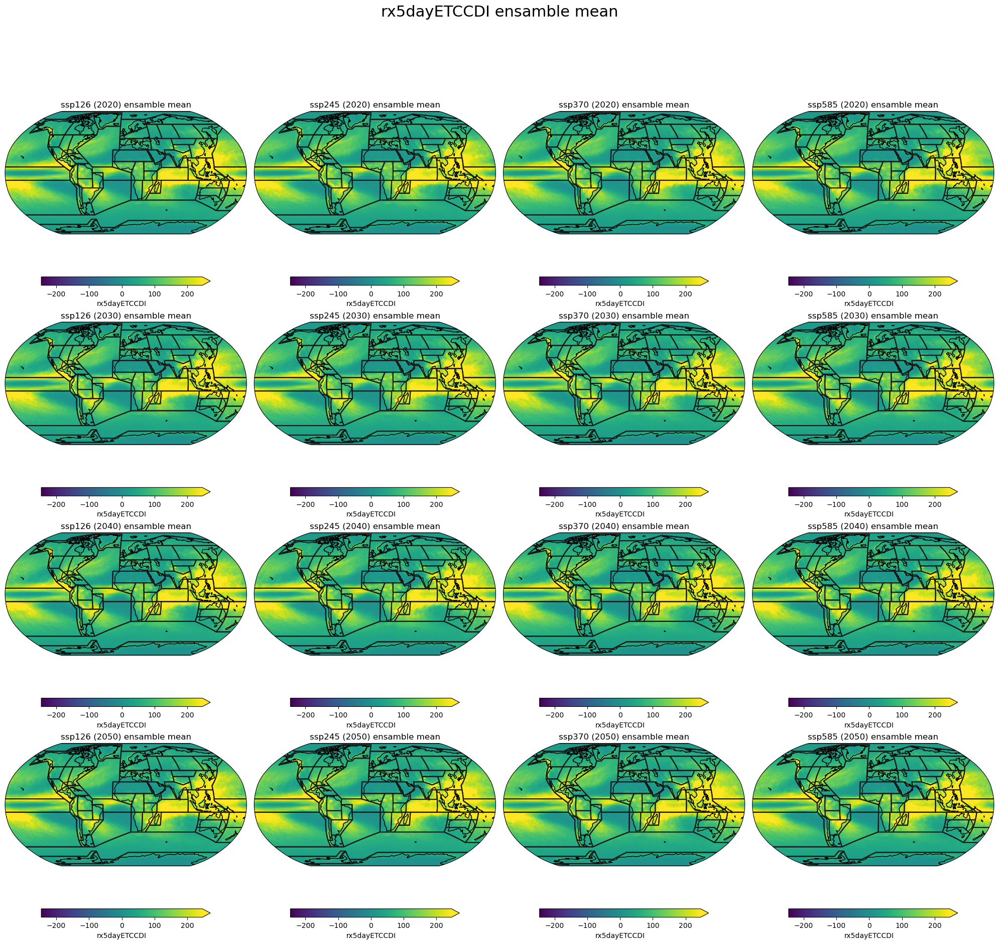

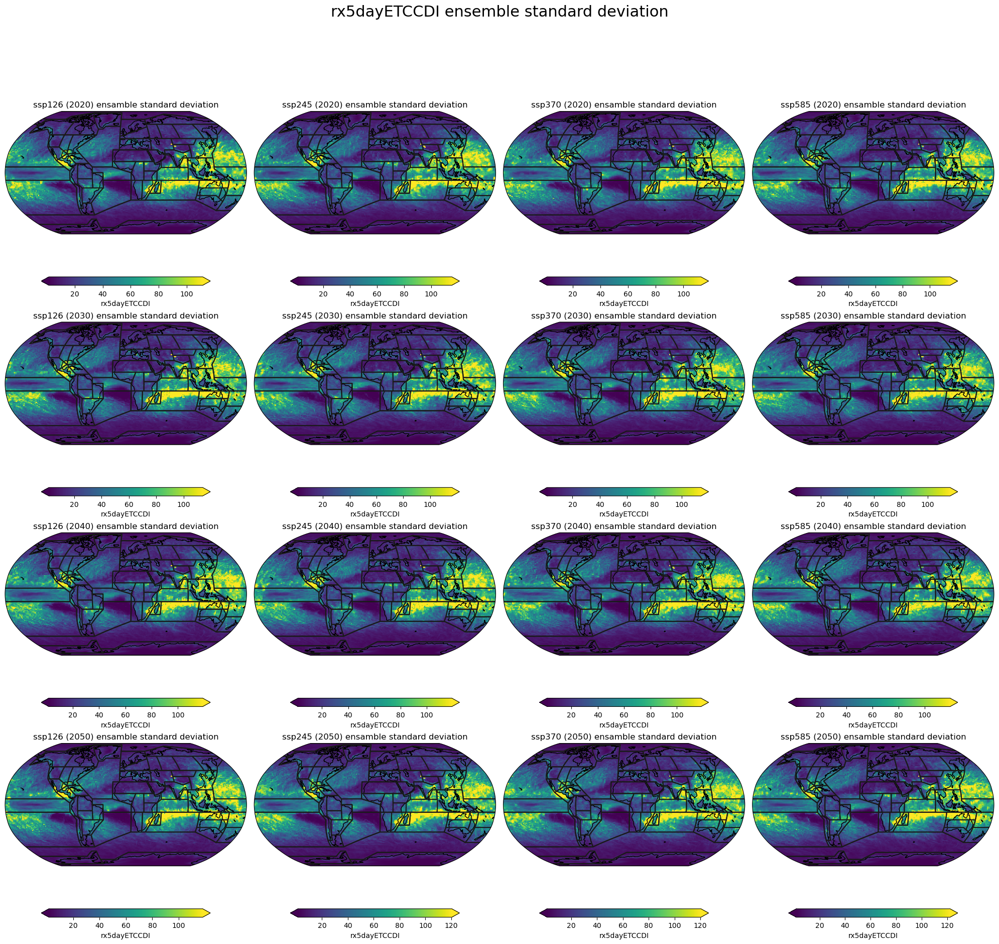

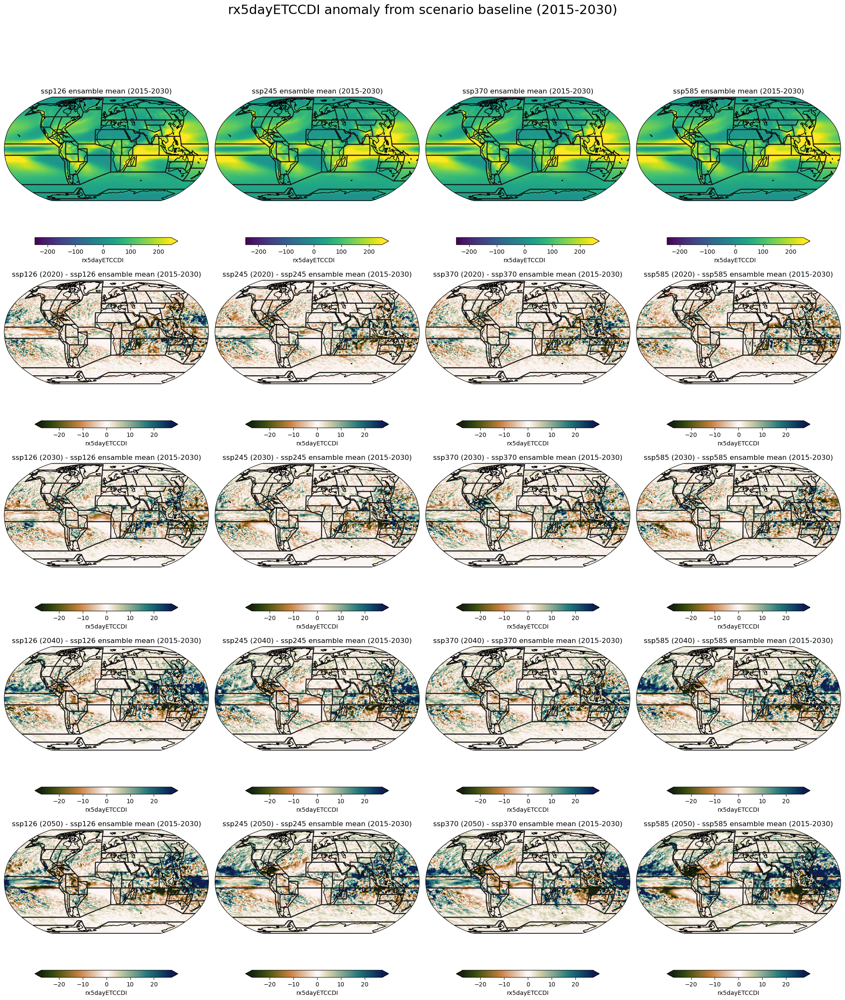

In [3]:
plot_mapplots_for_investigation(ensambles, var, [2020, 2030, 2040, 2050], SSPs)

From the plots there are some regions that are more interesting then others. However there is a large amount of noise spatially, that is: it is hard to extract clear patterns. I will therefore apply the masks that where most promising for the percipitation data and evalute based on the ensambles. 
- nomask
- seamask
- landmask
- seamask pm 30 deg
- pr large deviation mask (['SCA', 'CAR', 'NAO', 'EAO'])

## Create unmasked l climatologies

In [7]:
main_data_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies/nomask/' + var
main_save_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies/nomask/' + var

for scenario in SSPs:
    data_folder = '/'.join([main_data_folder, scenario])
    save_folder = '/'.join([main_save_folder, scenario])
    for file_name in file_handler.get_all_netcdf_files_in_dir(data_folder):
        ds = file_handler.read_netcdf_to_xr(directory=data_folder, file_name=file_name)
        weights = np.cos(np.deg2rad(ds['lat']))
        weights.name = "weights"        
        preprocesser.create_spatial_climatology(ds, var, 
                                                weights, 
                                                climatology_type='global', 
                                                save_to_dataset=True, 
                                                file_name=file_name.replace('.nc', f'_glob.nc'), 
                                                directory=save_folder, 
                                                is_original_name=False, 
                                                re_open=False)

In [ ]:
for mask_name in ['land_mask', 'sea_mask', 
                  'lat_mask_pm30deg', 'land_mask_pm30deg', 'sea_mask_pm30deg', 
                  'pr_decrease_mask','pr_increase_mask', 'pr_large_deviation_mask']:
    create_masked_climatologies(mask_name, var,
                                excisting_mask=True, 
                                test_file=file_handler.read_netcdf_to_xr('/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies/nomask/rx5dayETCCDI/ssp126/rx5dayETCCDI_yr_ACCESS-ESM1-5_ssp126_r1i1p1f1_2015-2100.nc'))

Lets investigate the ensambles

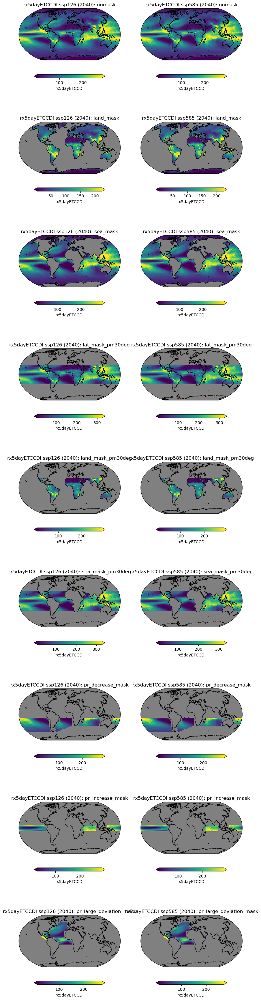

In [8]:
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies'
SSPs = ['ssp126', 'ssp585']
var = 'rx5dayETCCDI'
mask_names = ['nomask', 'land_mask', 'sea_mask', 
              'lat_mask_pm30deg', 'land_mask_pm30deg', 'sea_mask_pm30deg', 
              'pr_decrease_mask','pr_increase_mask', 'pr_large_deviation_mask']
fig, axs = plt.subplots(ncols=len(SSPs), nrows=len(mask_names), 
                        figsize=(5*len(SSPs), 5*len(mask_names)),
                        subplot_kw=dict(projection=ccrs.Robinson(central_longitude=0), facecolor="gray"))
axs = axs.flatten()

i = 0
for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name, var])
    for scenario in SSPs:
        data_dir = '/'.join([mask_data_dir, scenario])
        ensamble = ens.create_ensemble(Path(data_dir).glob("*.nc")) 
        ensamble_mean = ensamble.mean(dim='realization') 

        plot_on_map(ensamble_mean.sel(year=2040)[var], ax=axs[i], title=f'{var} {scenario} ({2040}): {mask_name}')

        i += 1

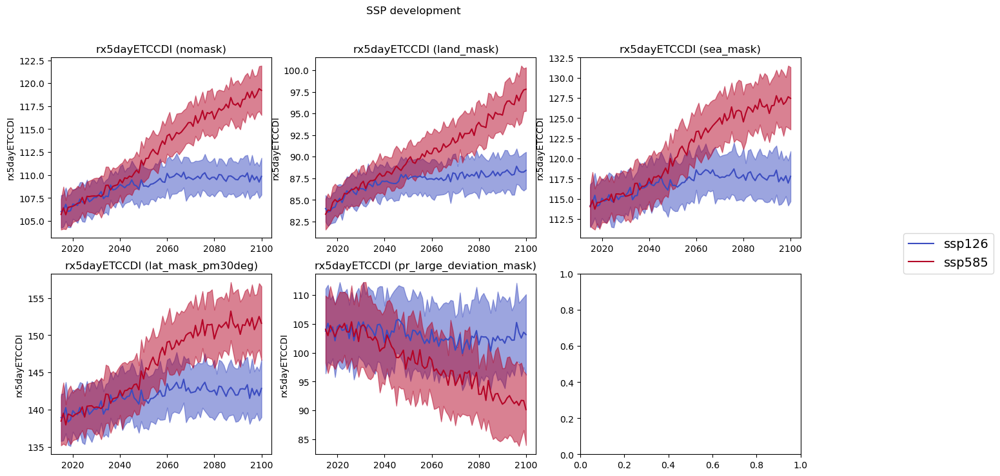

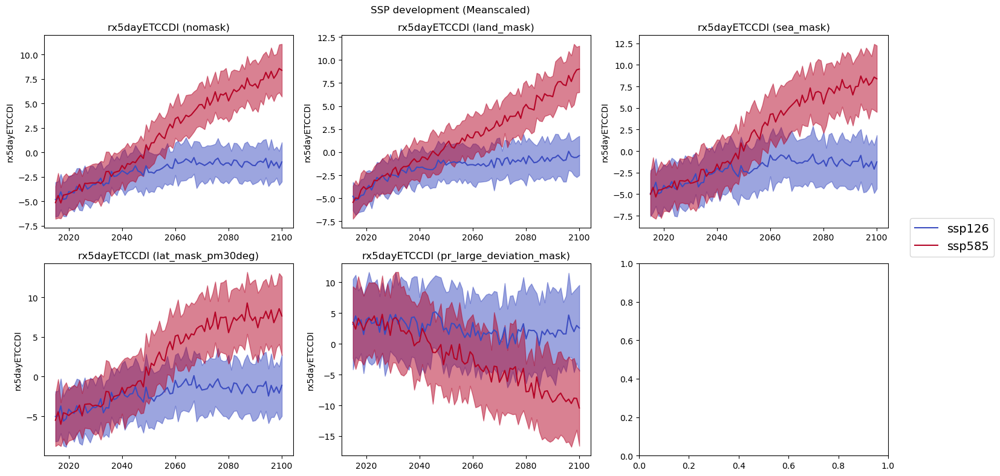

In [2]:
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
mask_names = ['nomask', 'land_mask', 'sea_mask', 
              'lat_mask_pm30deg', 'pr_large_deviation_mask']
SSPs = ['ssp126', 'ssp585']
var = 'rx5dayETCCDI'
plot_annual_global_ensambles(main_data_dir, SSPs, var,
                             mask_names)

The ensamble time series show that many of these maskings has a lower SNR then the original masking. I therefore delete the files. However the masks are still available.
I will keep climatologies from:
- nomask
- seamask
- landmask
- latmask pm 30 deg
- pr large deviation mask (['SCA', 'CAR', 'NAO', 'EAO'])